In [5]:
import librosa
import numpy as np
import os
import dask
from dask import delayed
import torch
import torchaudio
from src.modules.training.datasets.to_2d.spec import Spec
import functools
import matplotlib.pyplot as plt
import sounddevice as sd
from tqdm import tqdm

@delayed
def load_audio(path: str):
    """Load audio data lazily using librosa.

    :param path: Path to the audio file
    :return: Audio data
    """
    return librosa.load(path, sr=32000, dtype=np.float32)[0]

In [6]:

path = '/home/tolga/Documents/q4-bird-clef/data/raw/2024/unlabeled_soundscapes/'
# Read all ogg files inside this directory
audio = []
for filename in os.listdir(path):
    audio.append(load_audio(path + filename))

audio = np.array(audio, dtype='object')
print(audio.shape)


(8444,)


In [7]:
@delayed
def split_audio(audio):
    # given an audio signal that is 4 minutes split it into 5 second segments
    # if the length is not 4 minutes with a sample rate of 32000 crop or pad the audio appropriately
    
    # Calculate the total number of samples for 4 minutes
    total_samples = 4 * 60 * 32000
    
    if audio.shape[0] > total_samples:
        audio = audio[:total_samples]
    elif audio.shape[0] < total_samples:
        audio = np.append(audio, np.zeros(total_samples - audio.shape[0]))

    segment_length = 5 * 32000  # 5 seconds * sample rate
    segments = audio.reshape(-1, segment_length)

    return segments

In [8]:
segments = []
for file in audio:
    segments.append(split_audio(file))

In [9]:
bs = 1
n_samples = len(segments)
energies = np.zeros([len(segments), 48])
import os
import pickle

pkl_file = 'unlabelled_segment_energies.pkl'

if os.path.exists(pkl_file):
    with open(pkl_file, 'rb') as file:
        unlabelled_segment_energies = pickle.load(file)
        for i, key in enumerate(unlabelled_segment_energies):
            energies[i] = unlabelled_segment_energies[key]
else:
    for i in tqdm(range(0, n_samples, bs)):
        test = dask.compute(segments[i:i+bs])
        windows = np.stack(test)
        #print(windows.shape)
        S = np.abs(windows) ** 2
        energies[i] = S.sum(axis=-1)




In [10]:
path = '/home/tolga/Documents/q4-bird-clef/data/raw/2024/unlabeled_soundscapes/'
# Read all ogg files inside this directory
segment_energies = {}
for i, filename in enumerate(os.listdir(path)):
    segment_energies[filename] = energies[i]

import pickle
with open('unlabelled_segment_energies.pkl', 'wb') as file:
    pickle.dump(segment_energies, file)

In [11]:
segment_energies

{'1329430813.ogg': array([162.11915588, 488.01489258, 703.16253662, 169.2808075 ,
        252.93847656, 511.16259766, 171.89459229, 530.18395996,
        341.78234863, 174.74353027, 115.19347382, 357.58035278,
        223.9180603 , 508.02236938, 327.61557007, 472.60470581,
        317.13171387, 282.38082886, 372.18490601, 277.86248779,
        251.30296326, 110.59626007, 215.6973877 , 257.43307495,
        111.3874054 , 103.2322998 , 158.0020752 , 218.15213013,
        136.85205078, 243.50799561, 116.9757843 , 101.68520355,
         78.91181183, 419.56295776, 179.743927  , 467.76547241,
        112.35694122, 125.59867096, 561.25231934,  98.20760345,
        351.87307739, 174.37188721, 355.83883667, 418.88983154,
        147.42549133, 509.1378479 , 157.9724884 , 235.44371033]),
 '1706056993.ogg': array([ 86.577034  ,  92.68831635, 101.64131165, 101.36941528,
         94.93128967,  92.79901123, 102.3213501 ,  96.18074799,
         93.82840729,  93.70449829,  97.70443726,  96.16149139,
  

(1, 1, 48, 160000)
torch.Size([48, 160000])
torch.Size([48, 1, 672, 224])


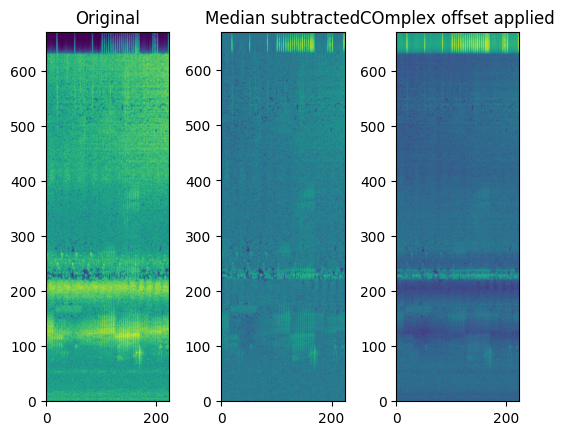

torch.Size([159446])


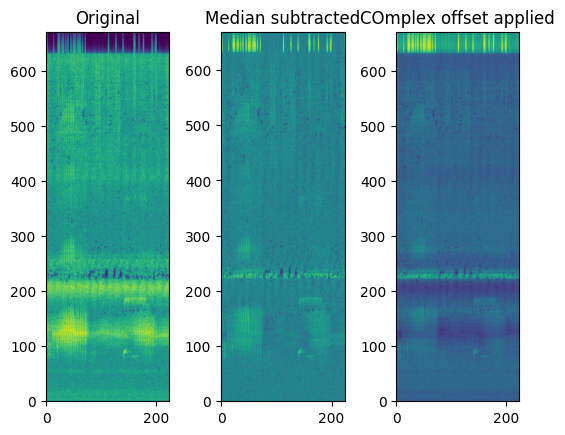

torch.Size([159446])


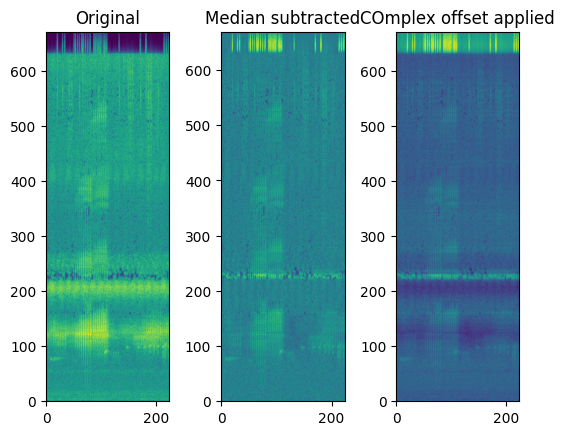

torch.Size([159446])


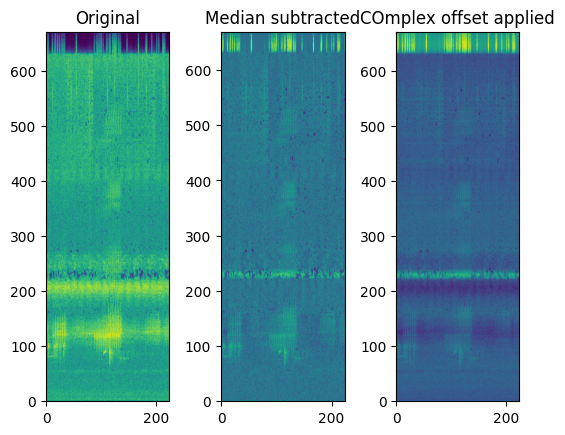

torch.Size([159446])


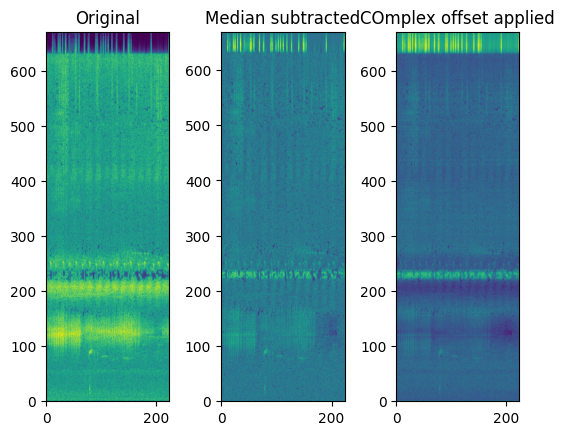

torch.Size([159446])


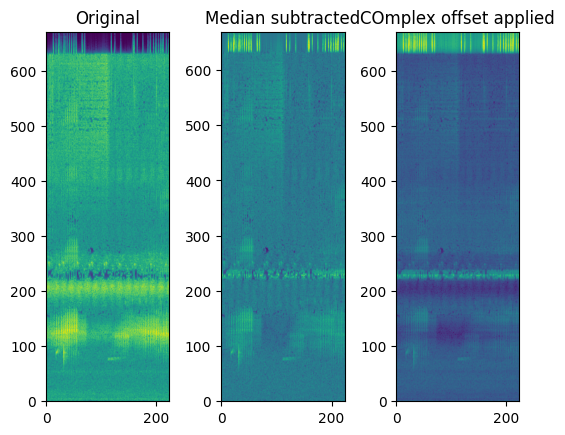

torch.Size([159446])


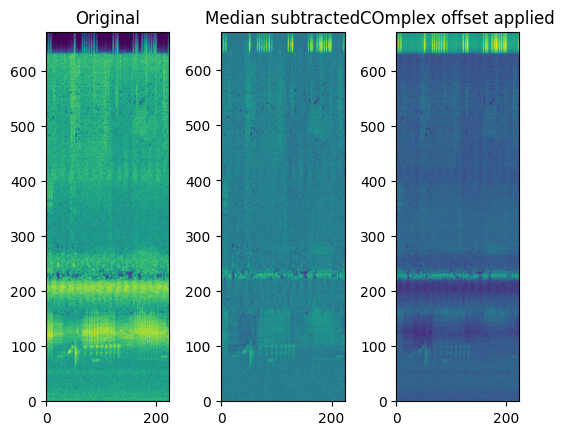

torch.Size([159446])


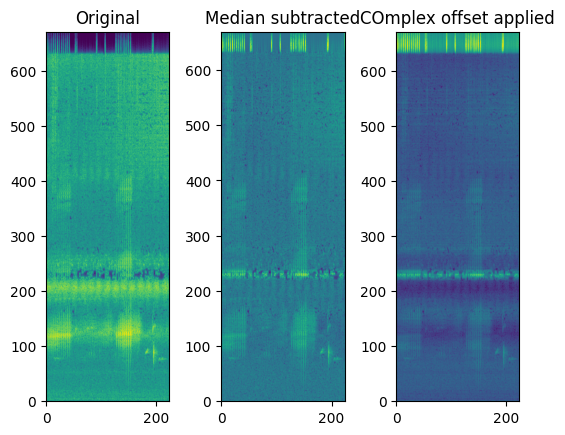

torch.Size([159446])


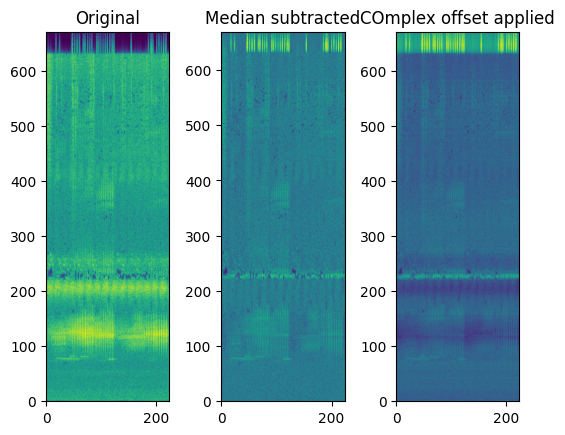

torch.Size([159446])


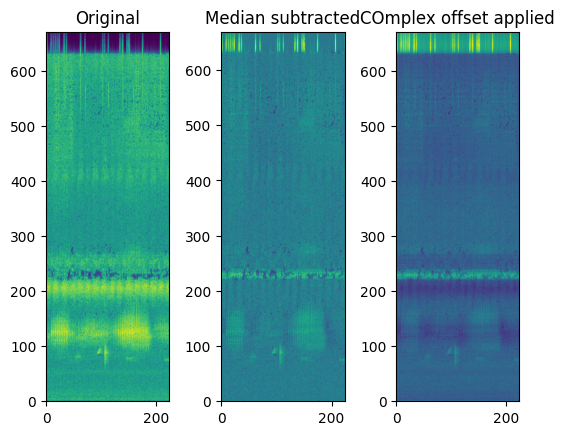

torch.Size([159446])


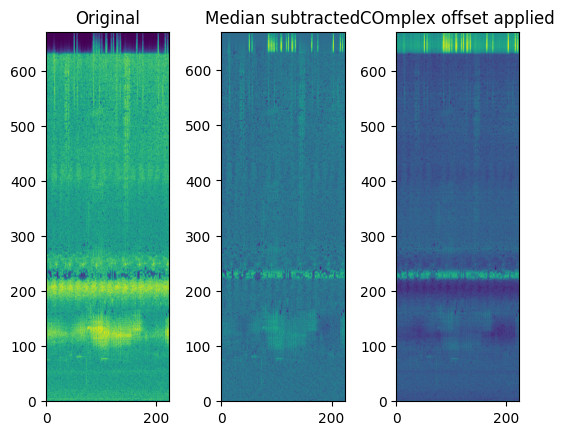

torch.Size([159446])


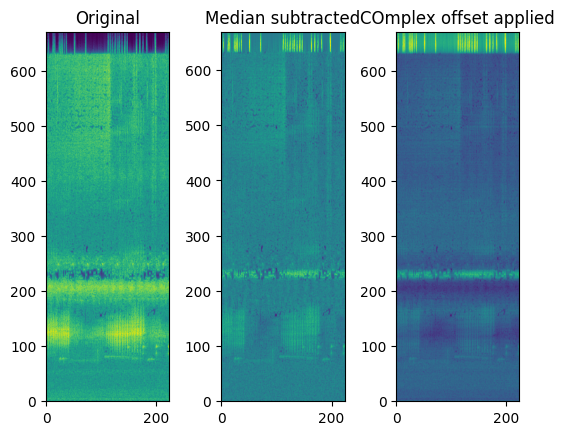

torch.Size([159446])


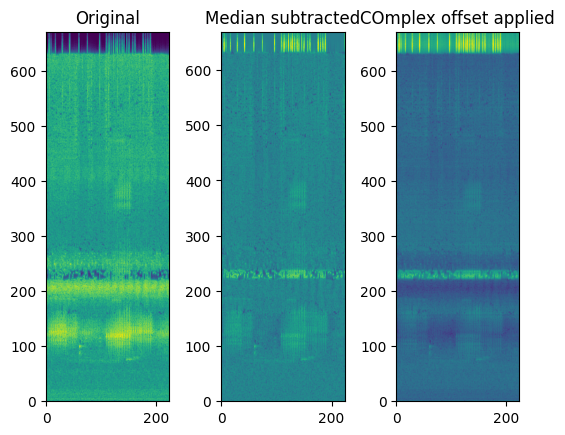

torch.Size([159446])


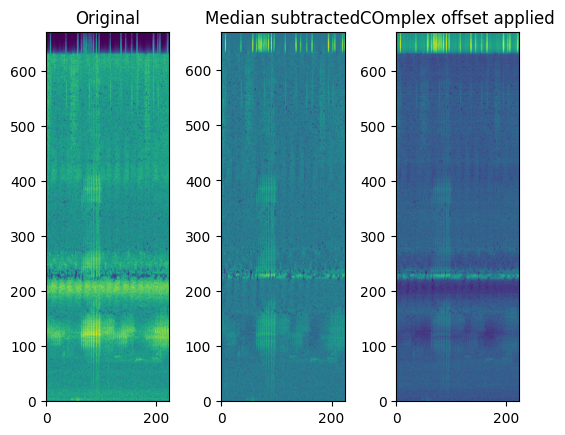

torch.Size([159446])


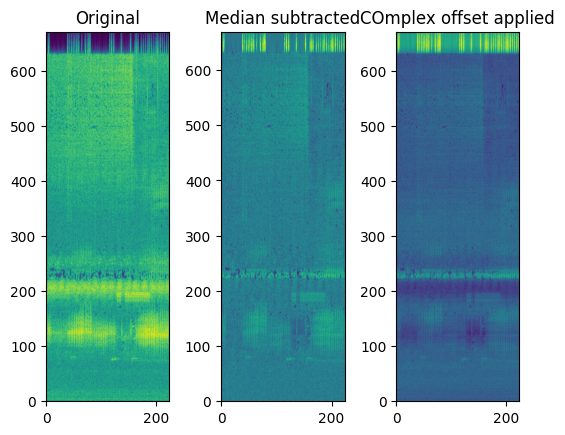

torch.Size([159446])


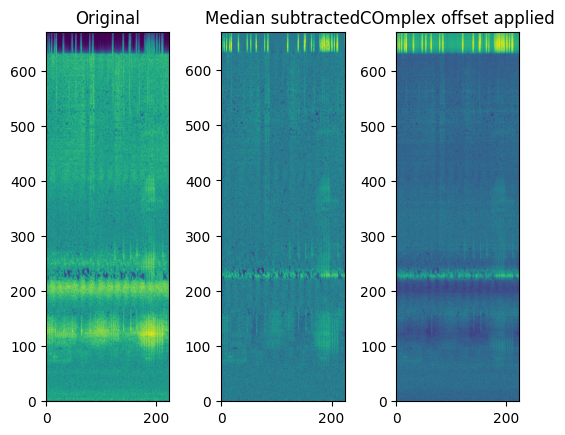

torch.Size([159446])


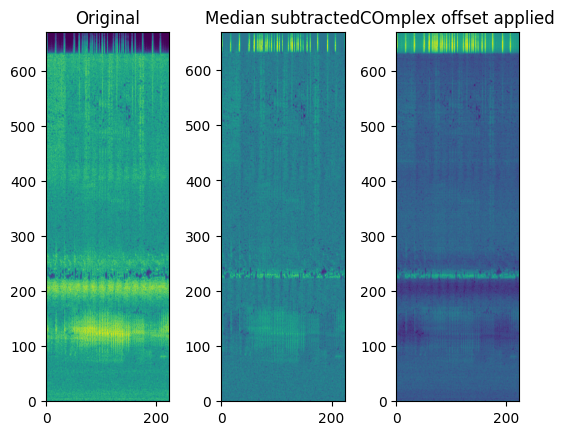

torch.Size([159446])


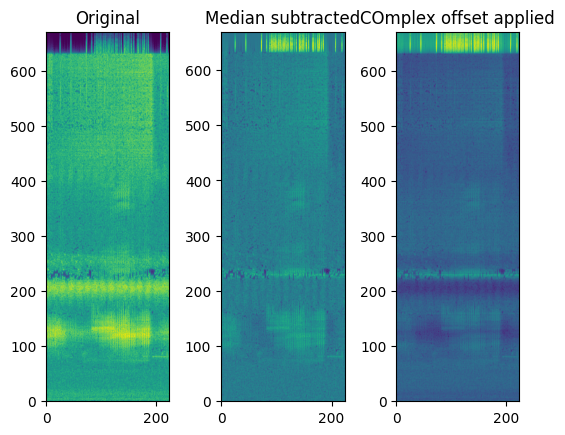

torch.Size([159446])


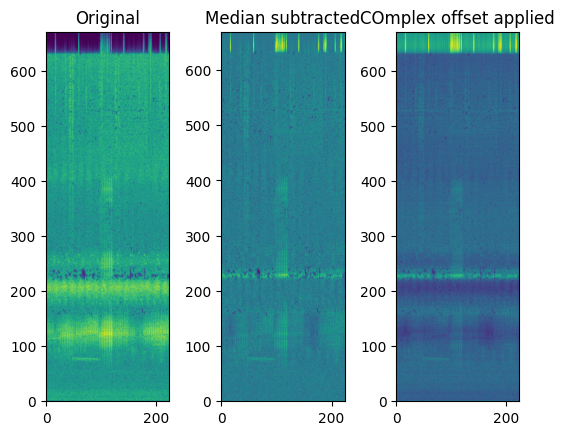

torch.Size([159446])


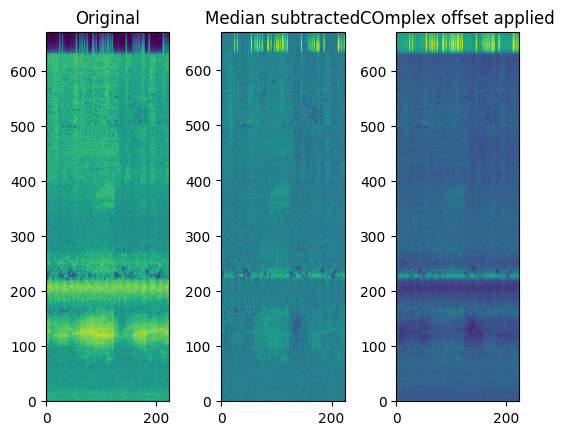

torch.Size([159446])


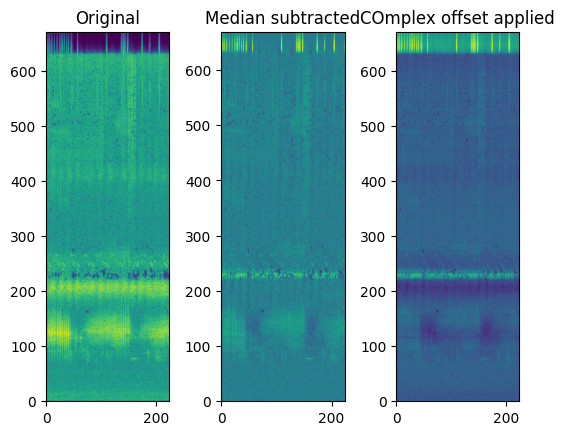

torch.Size([159446])


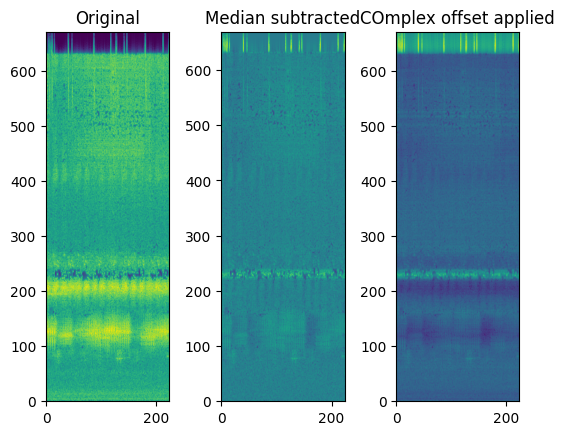

torch.Size([159446])


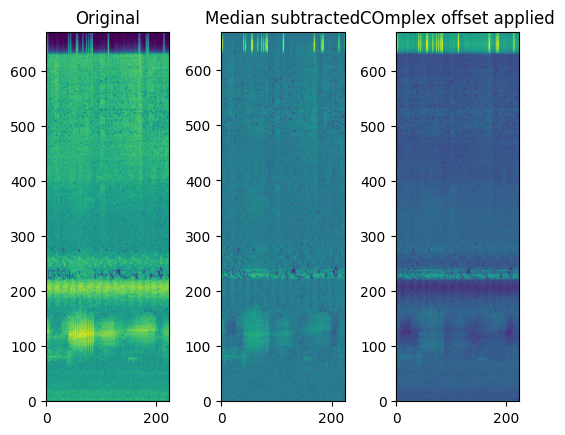

torch.Size([159446])


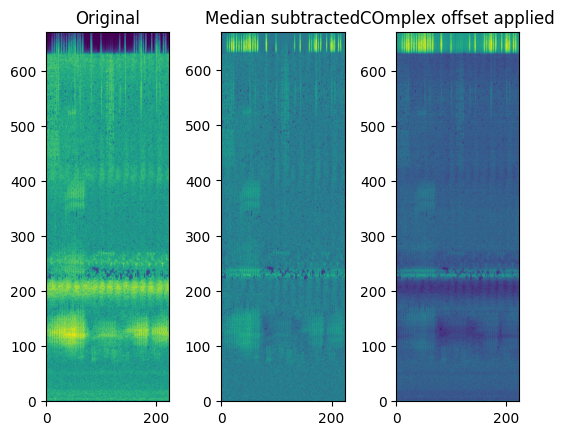

torch.Size([159446])


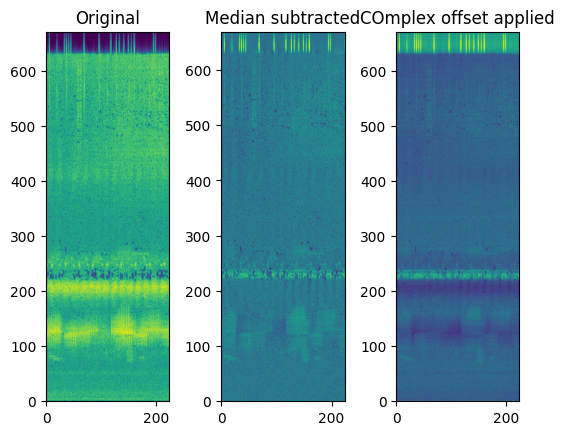

torch.Size([159446])


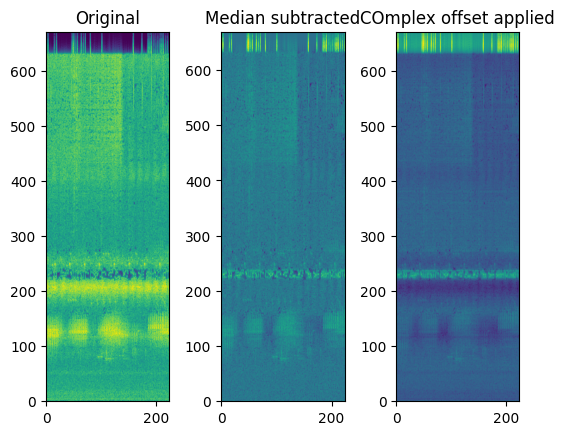

torch.Size([159446])


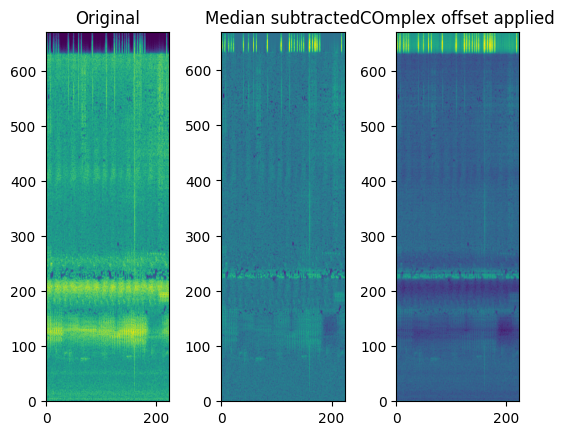

torch.Size([159446])


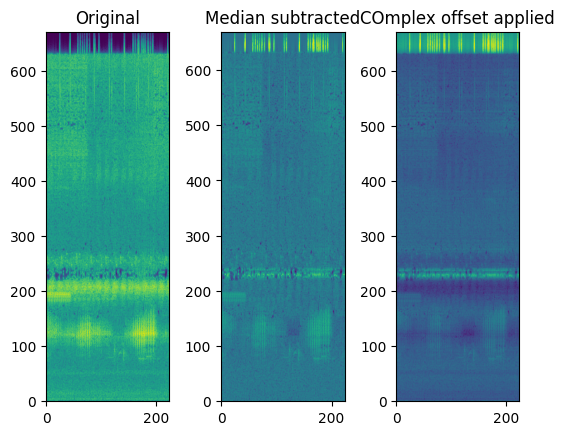

torch.Size([159446])


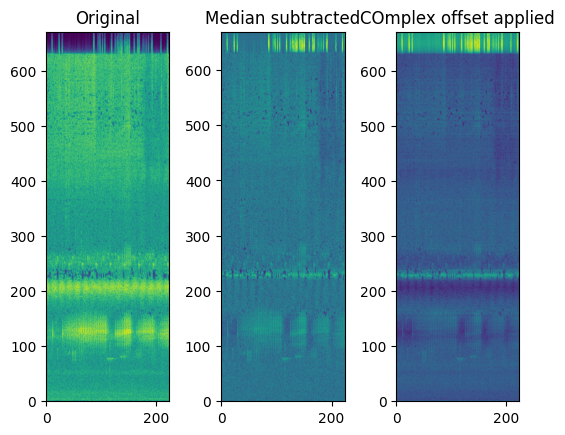

torch.Size([159446])


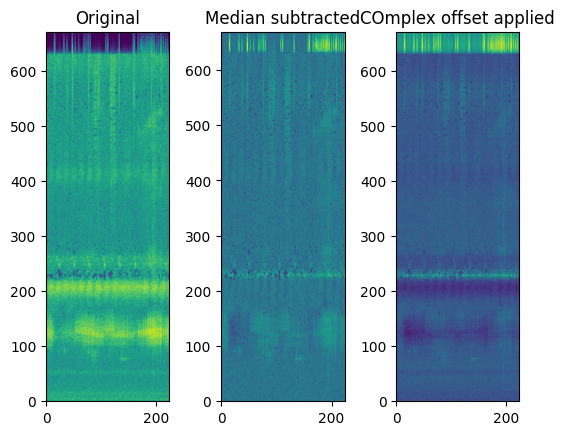

torch.Size([159446])


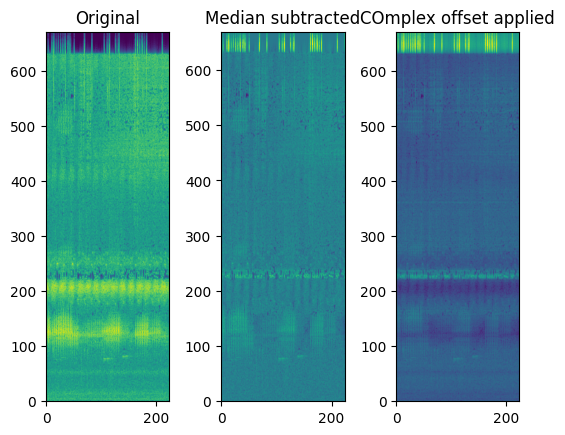

torch.Size([159446])


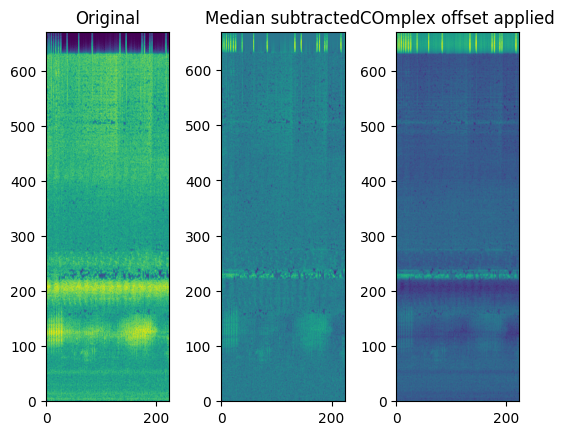

torch.Size([159446])


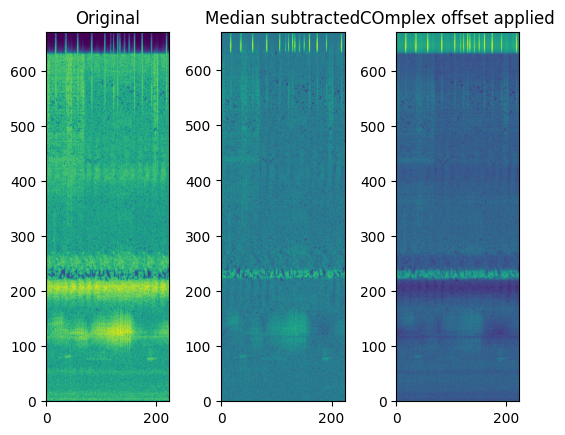

torch.Size([159446])


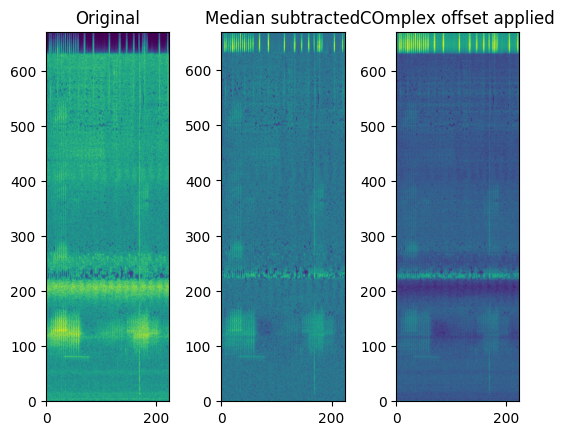

torch.Size([159446])


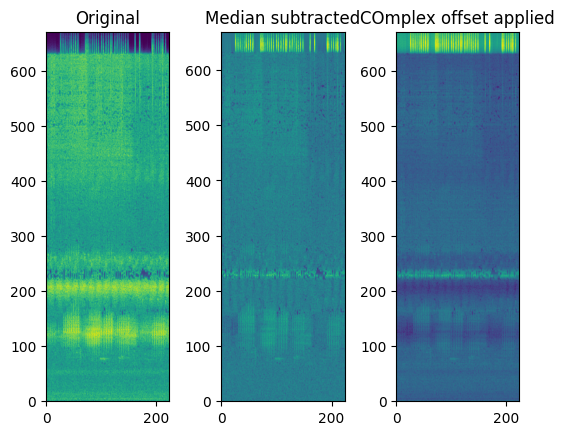

torch.Size([159446])


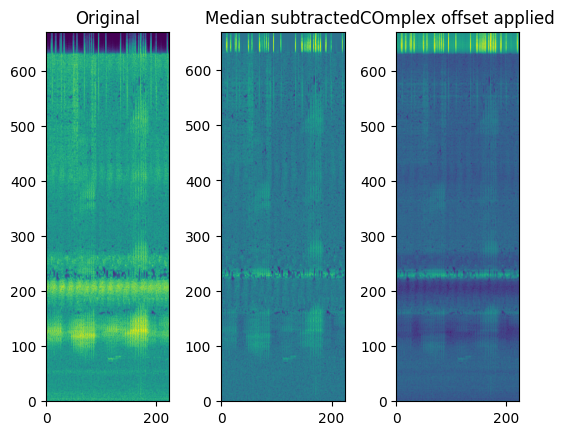

torch.Size([159446])


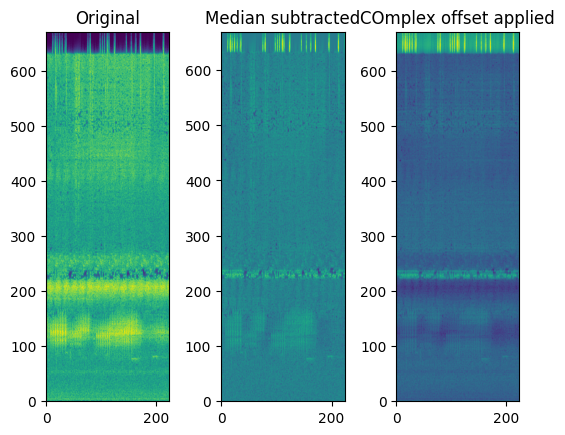

torch.Size([159446])


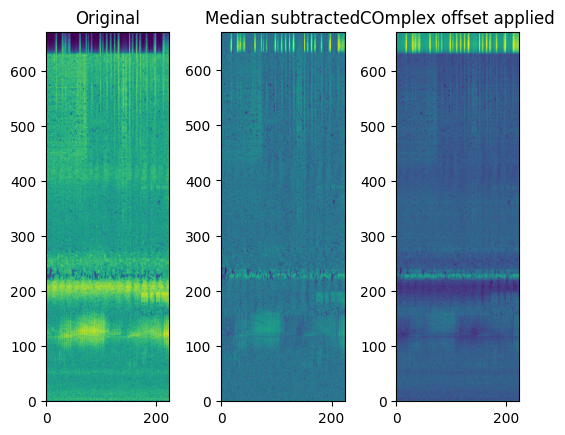

torch.Size([159446])


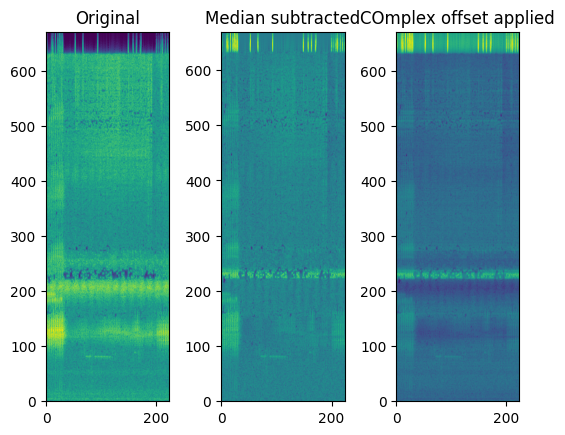

torch.Size([159446])


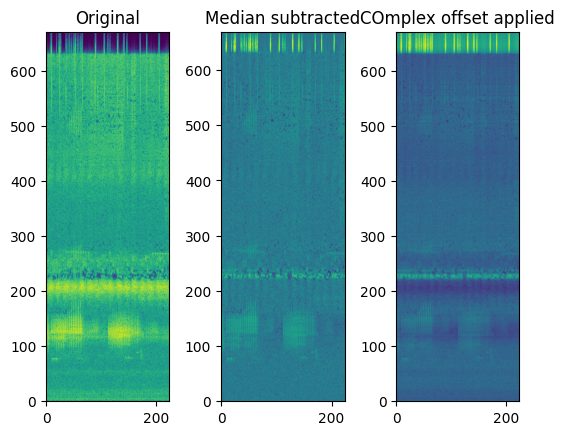

torch.Size([159446])


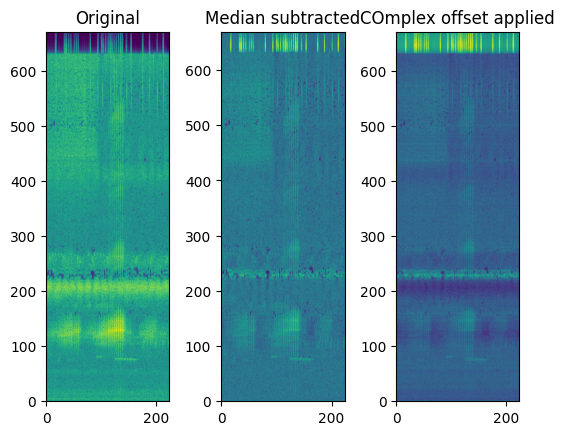

torch.Size([159446])


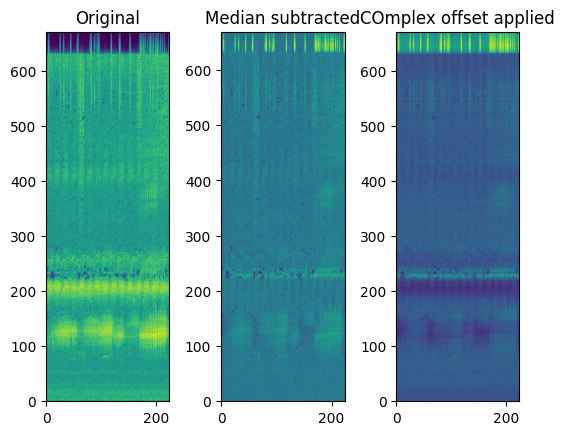

torch.Size([159446])


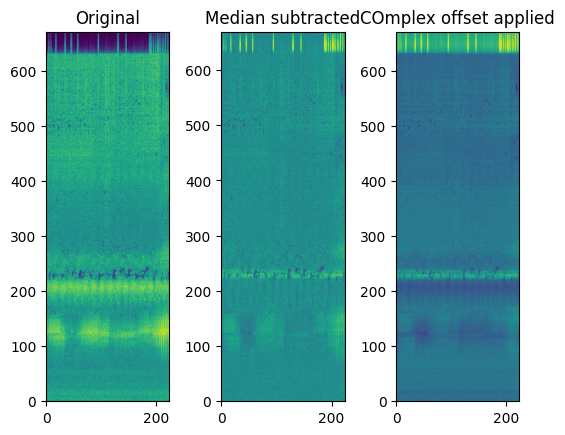

torch.Size([159446])


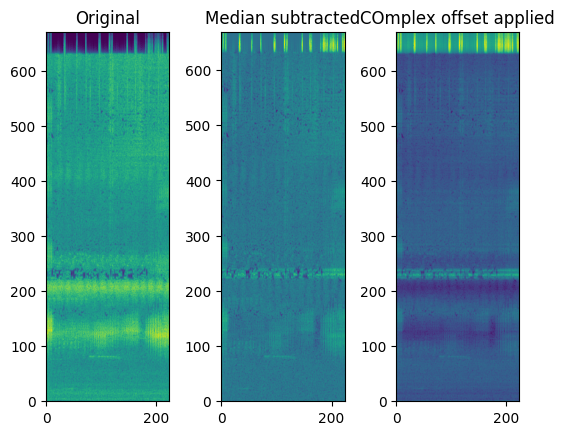

torch.Size([159446])


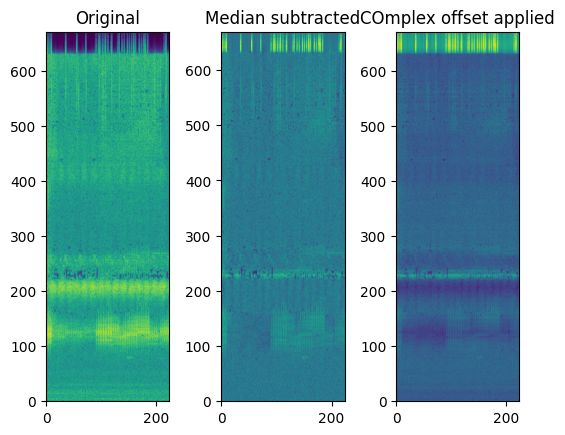

torch.Size([159446])


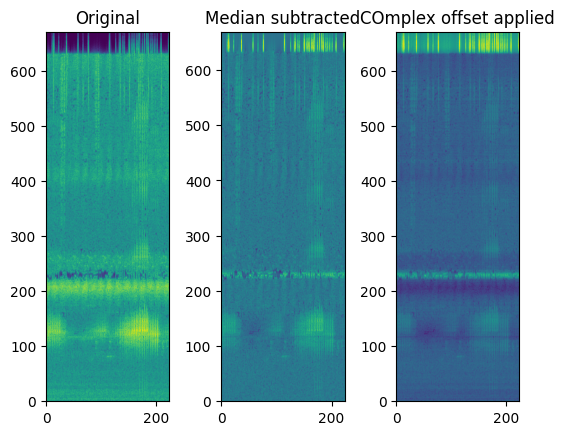

torch.Size([159446])


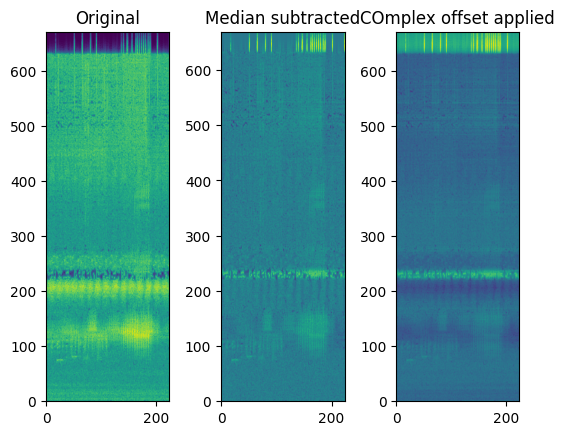

torch.Size([159446])


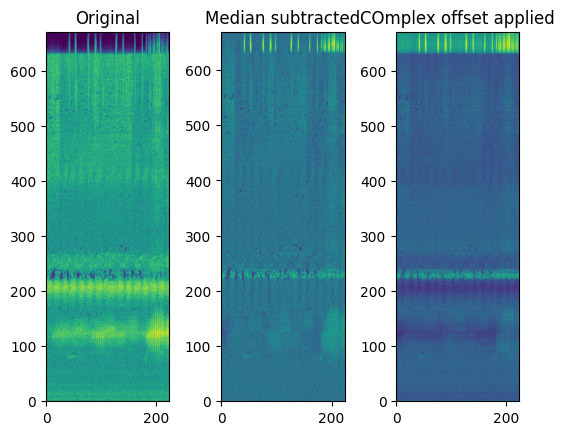

torch.Size([159446])


In [35]:
bs = 1
n_samples = 1
from src.modules.training.datasets.to_2d.spec_normalize import SpecNormalize
from torchaudio.transforms import InverseSpectrogram


spec_class = Spec(spec=functools.partial(torchaudio.transforms.Spectrogram), output_shape=[224*3,224])
inv_spec = InverseSpectrogram(n_fft=spec_class.instantiated_spec.n_fft, hop_length=spec_class.instantiated_spec.hop_length)
complex_spec_class = torchaudio.transforms.Spectrogram(n_fft=spec_class.instantiated_spec.n_fft, hop_length=spec_class.instantiated_spec.hop_length, power=None)
for i in range(0, n_samples, bs):
    test = dask.compute(segments[i:i+bs])
    windows = np.stack(test)
    print(windows.shape)
    # Extract spectrograms and plot them
    windows_tensor = torch.from_numpy(np.copy(windows)).squeeze()
    print(windows_tensor.shape)
    spectrograms = spec_class(windows_tensor)
    print(spectrograms.shape)
    #print(spectrograms.min())

    for j in range(spectrograms.shape[0]):

        med = torch.quantile(spectrograms[j,0], 0.2, dim=-1)
        spec = spectrograms[j,0] - med.unsqueeze(-1)
        fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
        ax1.imshow(spectrograms[j,0], origin='lower')
        ax1.set_title("Original")
        ax2.imshow(spec[:-2,:], origin='lower')
        ax2.set_title("Median subtracted")
        #sd.play(windows[0,0,j], blocking=True)
        # Now apply the median on the not log scaled complex spec
        # Extract complex spec
        complex_spec = complex_spec_class(windows_tensor[j])
        exp_offset = torch.pow(10, med.unsqueeze(-1))
        complex_spec /= exp_offset
        ax3.imshow(torch.log10(torch.abs(complex_spec)), origin='lower')
        ax3.set_title('COmplex offset applied')
        plt.show()
        # Invert the spectrgoram
        cleaned_audio = inv_spec(complex_spec)
        print(cleaned_audio.shape)
        #sd.play(cleaned_audio.numpy(), blocking=True)
